In [1]:
import pandas as pd
from matplotlib import pyplot as plt

from geobench_exp.experiment import parse_results
from geobench_exp.experiment.retrieve_runs import retrieve_runs

%load_ext autoreload
%autoreload 2

# RGB Classification

In [3]:
# directory where all the sweeps experiments are logged
classification_dir = '/mnt/data/experiments/nils/camera_class_seeds'

df = retrieve_runs(classification_dir, use_cached_csv=False, is_sweep=False)
df.rename(columns={"val_loss/dataloader_idx_0": "val_loss"}, inplace=True)
parse_results.count_exp(df)

100%|██████████| 5292/5292 [07:05<00:00, 12.45it/s]


model                         convnext_base  resnet18  resnet18_MOCO  \
dataset       partition_name                                           
m-bigearthnet 0.01x_train              12.0      12.0           12.0   
              0.02x_train              12.0      12.0           12.0   
              0.05x_train              11.0      12.0           12.0   
              0.10x_train              12.0      12.0           12.0   
              0.20x_train              12.0      12.0           12.0   
              0.50x_train              12.0      12.0           12.0   
              1.00x_train              11.0      11.0           12.0   
m-brick-kiln  0.01x_train              12.0      12.0           12.0   
              0.02x_train              12.0      12.0           12.0   
              0.05x_train              12.0      12.0           12.0   
              0.10x_train              12.0      12.0           12.0   
              0.20x_train              12.0      12.0           12.0   
              0.50x_train              12.0      12.0           12.0   
              1.00x_train              12.0      12.0           12.0   
m-eurosat     0.01x_train              12.0      12.0           12.0   
              0.02x_train              12.0      12.0           12.0   
              0.05x_train              12.0      12.0           12.0   
              0.10x_train              12.0      12.0           12.0   
              0.20x_train              12.0      12.0           12.0   
              0.50x_train              12.0      12.0           12.0   
              1.00x_train              12.0      12.0           12.0   
m-forestnet   0.01x_train              12.0      12.0           12.0   
              0.02x_train              12.0      12.0           12.0   
              0.05x_train              12.0      12.0           12.0   
              0.10x_train              12.0      12.0           12.0   
              0.20x_train              12.0      12.0           12.0   
              0.50x_train              12.0      12.0           12.0   
              1.00x_train              12.0      12.0           12.0   
m-pv4ger      0.01x_train              12.0      12.0           12.0   
              0.02x_train              12.0      12.0           12.0   
              0.05x_train              12.0      12.0           12.0   
              0.10x_train              12.0      12.0           12.0   
              0.20x_train              12.0      12.0           12.0   
              0.50x_train              12.0      12.0           12.0   
              1.00x_train              12.0      12.0           12.0   
m-so2sat      0.01x_train              12.0      12.0           12.0   
              0.02x_train              12.0      12.0           12.0   
              0.05x_train              12.0      12.0           12.0   
              0.10x_train              12.0      12.0           12.0   
              0.20x_train              12.0      12.0           12.0   
              0.50x_train              12.0      12.0           12.0   
              1.00x_train              12.0      12.0           12.0   

model                         resnet50  resnet50_MOCO  resnet50_SECO  \
dataset       partition_name                                           
m-bigearthnet 0.01x_train         12.0           12.0           12.0   
              0.02x_train         12.0           12.0           12.0   
              0.05x_train         12.0           11.0           12.0   
              0.10x_train         12.0           12.0           12.0   
              0.20x_train         12.0           12.0           12.0   
              0.50x_train         12.0           12.0           12.0   
              1.00x_train          9.0           12.0           12.0   
m-brick-kiln  0.01x_train         12.0           12.0           12.0   
              0.02x_train         12.0           12.0           12.0   
              0.05x_train         12.0 

In [9]:
df = df[df["model"].isin(['vit_tiny_patch16_224', 'vit_small_patch16_224',
       'swinv2_tiny_window16_256', 'scratch_resnet18',
       'resnet50_MOCO', 'resnet50', "resnet50_SECO",
       'resnet18_MOCO', 'resnet18', 'convnext_base'])]
df.model.unique()

array(['vit_tiny_patch16_224', 'vit_small_patch16_224',
       'swinv2_tiny_window16_256', 'scratch_resnet18', 'resnet50_SECO',
       'resnet50_MOCO', 'resnet50', 'resnet18_MOCO', 'resnet18',
       'convnext_base'], dtype=object)

0it [00:00, ?it/s]

m-so2sat


1it [00:07,  7.23s/it]

m-pv4ger


2it [00:13,  6.85s/it]

m-forestnet


3it [00:22,  7.47s/it]

m-eurosat


4it [00:29,  7.56s/it]

m-brick-kiln


5it [00:38,  7.95s/it]

m-bigearthnet


6it [00:46,  7.81s/it]


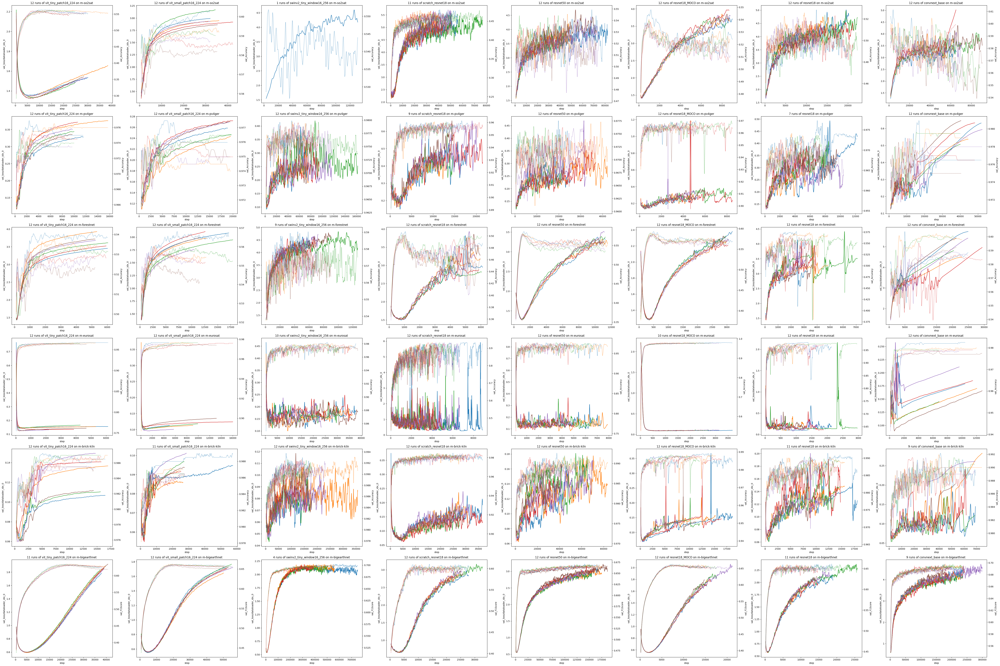

In [5]:

df_1x = df[(df["partition_name"] == "1.00x_train") | (df["partition_name"] == "default")]

best_points_df = parse_results.plot_all_models_datasets(df_1x, plot_fn=parse_results.make_plot_sweep(filt_size=10, top_k=6, legend=False), fig_size=(60,40))
plt.tight_layout()


In [ ]:

# plt.rcParams['figure.figsize'] = [40, 40]

df_1x = df[(df["partition_name"] == "1.00x_train") | (df["partition_name"] == "default")]

parse_results.plot_all_datasets(df_1x, model="resnet18", plot_fn=parse_results.make_plot_sweep(filt_size=20, top_k=10, legend=True), fig_size=(20,20))
# parse_results.plot_all_datasets(df_1x, model="resnet50")

plt.tight_layout()


In [ ]:
parse_results.plot_all_models_datasets(df_1x, plot_fn=parse_results.make_plot_sweep(filt_size=20, top_k=6, legend=False), fig_size=(40,40))
plt.tight_layout()

# Beyond RGB Classification

In [2]:
# directory where all the sweeps experiments are logged
beyond_classification_dir =  '/mnt/data/experiments/nils/camera_class_beyond_seeds'
# beyond_classification_dir = '/mnt/data/experiments/nils/final_classification_beyond_rgb_seeded_runs'

beyond_rgb_models_df = retrieve_runs(beyond_classification_dir, use_cached_csv=False, is_sweep=False)

parse_results.count_exp(beyond_rgb_models_df)

100%|██████████| 288/288 [00:33<00:00,  8.55it/s]


,model,resnet50,resnet50_DINO,resnet50_MOCO,vit_small_patch16_224,vit_small_patch16_224_DINO,vit_small_patch16_224_MOCO
dataset,partition_name,,,,,,
m-bigearthnet,1.00x_train,12,12,12,12,12,12
m-brick-kiln,1.00x_train,12,12,12,12,12,12
m-eurosat,1.00x_train,12,12,12,12,12,12
m-so2sat,1.00x_train,12,12,12,12,12,12


0it [00:00, ?it/s]

m-so2sat


1it [00:02,  2.57s/it]

m-eurosat


2it [00:03,  1.81s/it]

m-brick-kiln


3it [00:05,  1.91s/it]

m-bigearthnet


4it [00:08,  2.02s/it]


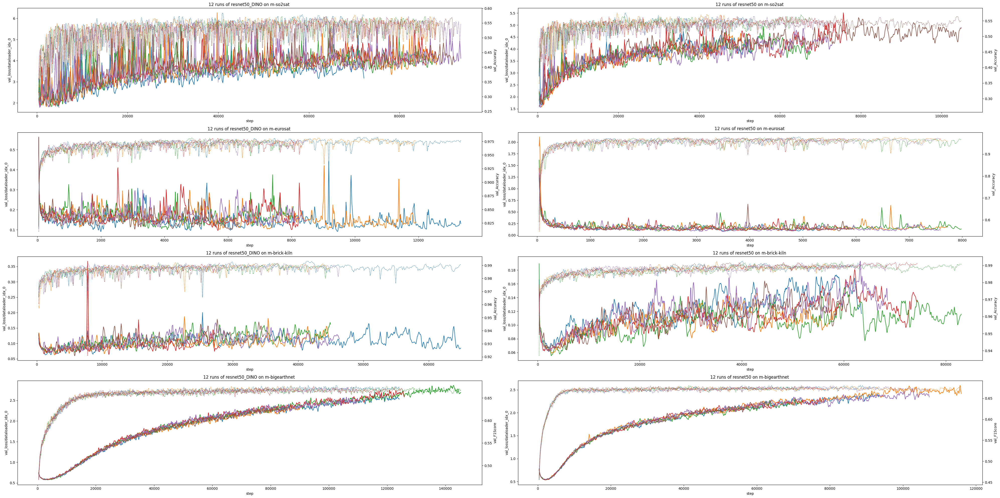

In [8]:
best_points_df = parse_results.plot_all_models_datasets(beyond_rgb_models_df, plot_fn=parse_results.make_plot_sweep(filt_size=5, top_k=6, legend=False), fig_size=(40,20))
plt.tight_layout()

In [ ]:
parse_results.plot_all_datasets(beyond_rgb_models_df, model="resnet50", plot_fn=parse_results.make_plot_sweep(filt_size=10, top_k=6, legend=True), fig_size=(20,20))


# RGB Segmentation

In [2]:
# directory where all the sweeps experiments are logged
segmentation_dir =  '/mnt/data/experiments/nils/camera_segmentation_seeds'
# segmentation_dir = '/mnt/data/experiments/nils/final_segmentation_seeded_runs'
df_seg = retrieve_runs(segmentation_dir, use_cached_csv=False, is_sweep=False)
parse_results.count_exp(df_seg)

100%|██████████| 2675/2675 [06:49<00:00,  6.53it/s]


model                          resnet101_DeepLabV3  resnet101_Unet  \
dataset        partition_name                                        
m-NeonTree     0.01x_train                    12.0            12.0   
               0.02x_train                    12.0            12.0   
               0.05x_train                    12.0            12.0   
               0.10x_train                    12.0            12.0   
               0.20x_train                    12.0            12.0   
               0.50x_train                    12.0            12.0   
               1.00x_train                     9.0            12.0   
m-SA-crop-type 0.01x_train                    12.0            12.0   
               0.02x_train                    12.0            12.0   
               0.05x_train                    12.0            11.0   
               0.10x_train                    12.0            12.0   
               0.20x_train                    11.0            12.0   
               0.50x_train                    11.0            12.0   
               1.00x_train                     6.0            12.0   
m-cashew-plant 0.01x_train                    12.0            12.0   
               0.02x_train                    12.0            12.0   
               0.05x_train                    12.0            12.0   
               0.10x_train                    12.0            12.0   
               0.20x_train                    12.0            12.0   
               0.50x_train                    12.0            12.0   
               1.00x_train                     9.0            12.0   
m-chesapeake   0.01x_train                    12.0            12.0   
               0.02x_train                    12.0            12.0   
               0.05x_train                    12.0            12.0   
               0.10x_train                    12.0            12.0   
               0.20x_train                    12.0            12.0   
               0.50x_train                    11.0            12.0   
               1.00x_train                     7.0            12.0   
m-nz-cattle    0.01x_train                    12.0            12.0   
               0.02x_train                    12.0            12.0   
               0.05x_train                    12.0            12.0   
               0.10x_train                    12.0            12.0   
               0.20x_train                    12.0            12.0   
               0.50x_train                    12.0            12.0   
               1.00x_train                    10.0            12.0   
m-pv4ger-seg   0.01x_train                    11.0            12.0   
               0.02x_train                    12.0            12.0   
               0.05x_train                    12.0            12.0   
               0.10x_train                    12.0            12.0   
               0.20x_train                    12.0            12.0   
               0.50x_train                     9.0            12.0   
               1.00x_train                     4.0            12.0   

model                          resnet18_DeepLabV3  resnet18_Unet  \
dataset        partition_name                                      
m-NeonTree     0.01x_train                   12.0           12.0   
               0.02x_train                   12.0           12.0   
               0.05x_train                   12.0           12.0   
               0.10x_train                   12.0           12.0   
               0.20x_train                    1.0            6.0   
               0.50x_train                    NaN            2.0   
               1.00x_train                   10.0           12.0   
m-SA-crop-type 0.01x_train                   12.0           12.0   
               0.02x_train                   12.0           12.0   
               0.05x_train                   12.0           12.0   
               0.10x_train                   12.0           12.0   
               0.20x_train         

In [3]:
best_seg_runs = parse_results.find_best_hparam_for_seeds(df_seg)

203it [01:36,  2.10it/s]


In [5]:
import json
with open('/mnt/home/geo-bench-experiments/geobench_exp/configs/seg_hparams_camera.json', 'w') as f:
    json.dump(best_seg_runs, f)

0it [00:00, ?it/s]

m-pv4ger-seg


1it [00:18, 18.89s/it]

m-nz-cattle


2it [00:39, 19.83s/it]

m-chesapeake


3it [00:57, 19.28s/it]

m-cashew-plant


4it [01:20, 20.43s/it]

m-SA-crop-type


5it [01:35, 18.61s/it]

m-NeonTree


6it [01:56, 19.37s/it]


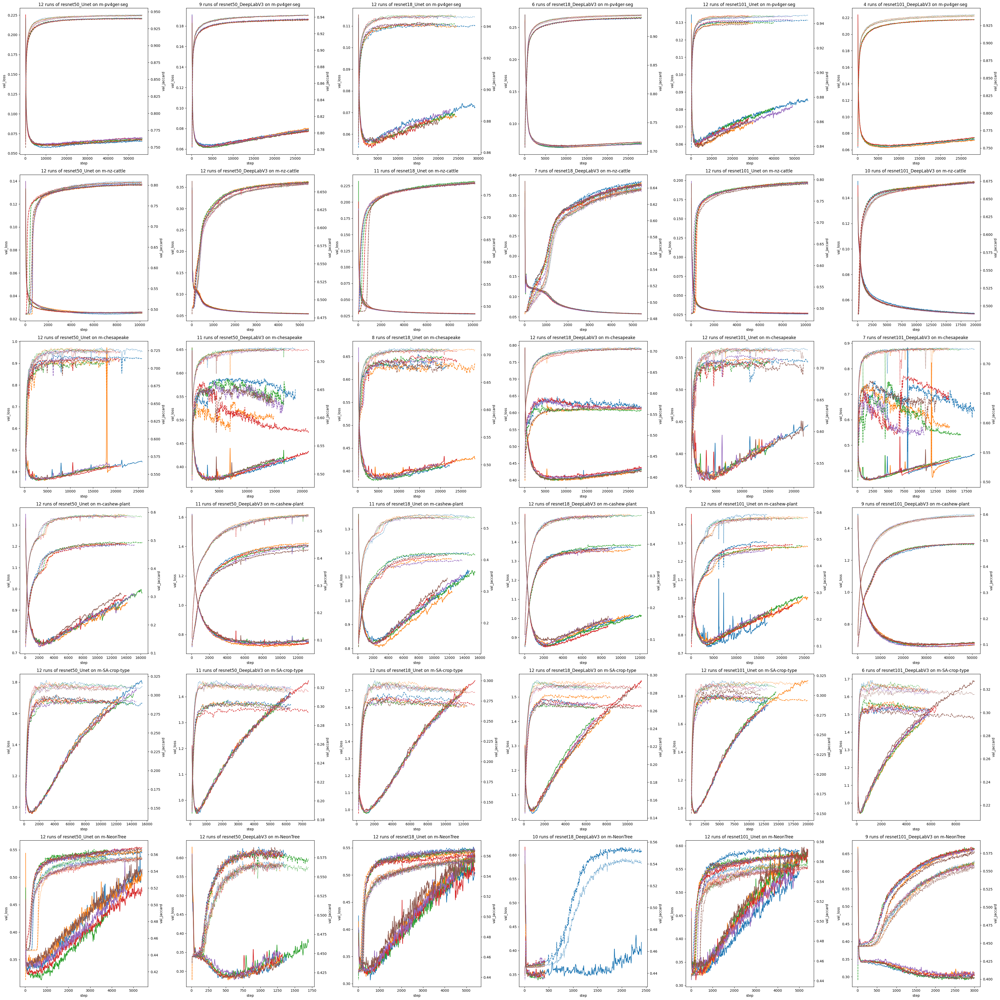

In [3]:

df_1x_seg = df_seg[(df_seg["partition_name"] == "1.00x_train") | (df_seg["partition_name"] == "default")]

best_points_df = parse_results.plot_all_models_datasets(df_1x_seg, plot_fn=parse_results.make_plot_sweep(filt_size=10, top_k=6, legend=False), fig_size=(40,40))
plt.tight_layout()